In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import arviz as az

az.style.use("arviz-docgrid")
plt.rcParams['figure.dpi'] = 140

experiment_orientations = [159, 123, 87, 51, 15]
subjects = ["01", "02", "03", "04", "05", "06", "07" ,"09", "10", "11", "12"]
median_key = {15:0, 51:1, 87:2, 123:3, 159:4}
std_key = {15:0, 51:1, 87:2, 123:3, 159:4}

c_table = pd.read_csv('../data_caches/ctiraltable.csv')
med = np.load('../data_caches/med.npy')
std = np.load('../data_caches/std.npy')
ctimetable = np.load('../data_caches/ctimetable.npy')
r_table = pd.read_csv('../data_caches/rtrialtable.csv')
(x, y, d, r, e) = np.load('../data_caches/rtimetable.npy', allow_pickle=True)

## Overview of subject's responses

In [3]:
def draw_sector(ax, angle, std_dev, radius=1, color='#7485C2', alpha=1):
    # Calculate start and end angles for the sector
    start_angle = np.radians(angle - std_dev)
    end_angle = np.radians(angle + std_dev)
    
    # Generate points for the sector
    theta = np.linspace(start_angle, end_angle, 100)
    x = radius * np.cos(theta)
    y = radius * np.sin(theta)
    
    # Fill the sector area starting from (0,0) to create a wedge
    ax.fill(np.concatenate([[0], x]), np.concatenate([[0], y]), color="#b2c5db", alpha=alpha)

    # Add markers at the start and end points of the arc
    ax.plot([x[0], x[-1]], [y[0], y[-1]], '+', color=color, markersize=10, alpha=1, label="2$\sigma$ Margins") 

    # Convert angle to radians
    angle_radians = np.radians(angle)
    
    # Calculate the x and y coordinates for the endpoint
    x = np.cos(angle_radians)
    y = np.sin(angle_radians)

    circle = plt.Circle((0, 0), 1, color='lightgray', fill=False, linestyle='--')
    ax.add_artist(circle)
    
    # Plot the line on the given axis
    ax.plot([0, x], [0, y], c=color, linestyle="-", marker="o", linewidth=2, markersize=10, label="Calibrated Target")

In [4]:
# Main plotting code
def plot_responses(sub, vx, vy, vid, vt, med, std):

    fig, axes = plt.subplots(1,5, figsize=(45, 10), dpi=300, sharex=True, sharey=True)  # 1 row, 5 columns
    for i, ax in enumerate(axes.flatten()):
        if i==5: break
        target_angle = experiment_orientations[i]
        mask = vt[sub] == target_angle

        vid_sub = vid[sub][mask]
        
        xd = vx[sub][mask]
        yd = vy[sub][mask]

        for i in range(len(xd)):
            ax.plot(xd[i][250:vid_sub[i]], yd[i][250:vid_sub[i]], c="k", alpha=0.1)
        
        # Plot scatter data
        ax.set_title(f'Target {target_angle} deg', fontsize=40)
        
        # Putting the origianl target angle
        cx = np.cos(np.radians(target_angle))
        cy = np.sin(np.radians(target_angle))
        # 681213
        ax.plot([0, cx], [0, cy], c="red", linestyle="--", marker=".", linewidth=2, markersize=10, label="Presented Target")
        # Draw line for target angle
        draw_sector(ax, med[sub,median_key[target_angle]], std[sub,std_key[target_angle]], color='blue')

        # Set title and limits
        ax.set_xlim(-1.2, 1.2)
        ax.set_ylim(-0.2, 1.2)
        ax.set_aspect('equal', adjustable='box')
        ax.set_xlabel('x (a.u.)')
        ax.set_ylabel('y (a.u.)')
        
        # legend without background
        ax.legend(loc='lower right', frameon=False, fontsize=24)

    # axes[1,2].axis("off")

    # Set aspect ratio for all plots in the row
    plt.gca().set_aspect('equal', adjustable='box')
    # plt.tight_layout()
    plt.show()

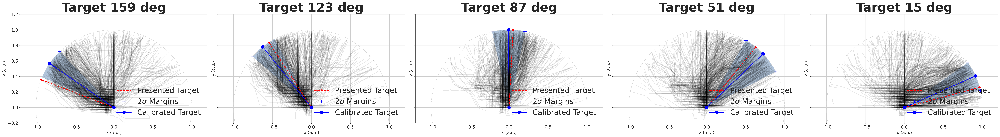

In [5]:
vx = x.reshape(12, 4*6*120, 1000)
vy = y.reshape(12, 4*6*120, 1000)
vid = r_table["f_resp"].values.reshape(12, 4*6*120)
vt = r_table["target"].values.reshape(12, 4*6*120)

plot_responses(8, vx, vy, vid, vt, med, std)

## Cal info

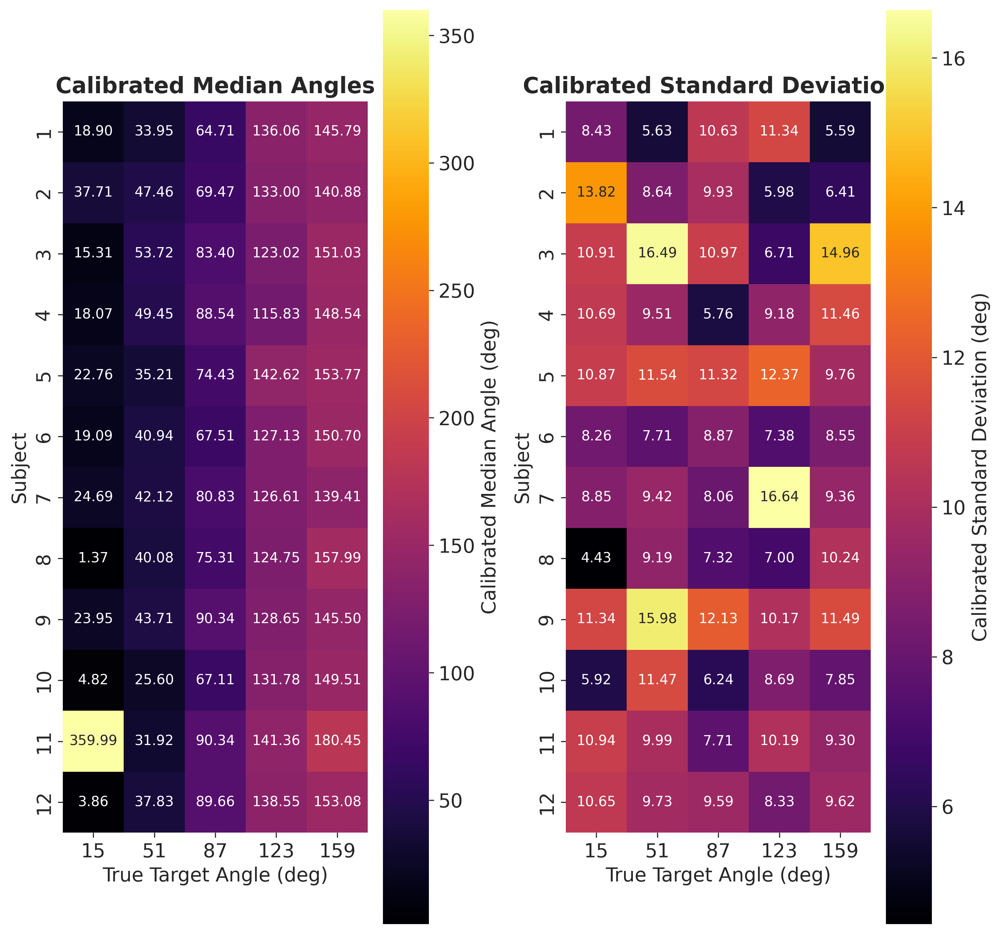

In [9]:
# True targets for medians = 15, 51, 87, 123, 159
# sns.heatmap(med, cmap="inferno", cbar_kws={'label': 'Calibrated Median Angle (deg)'})

# Plot sns heatmaap for the median angles. make each box a square
fig, ax = plt.subplots(1,2, figsize=(10, 10), dpi=300)

med_ax = ax[0]
std_ax = ax[1]

sns.heatmap(med, cmap="inferno", cbar_kws={'label': 'Calibrated Median Angle (deg)'}, square=True, ax=med_ax, annot=True, fmt=".2f")
xticks = [f"{i}" for i in [15, 51, 87, 123, 159]]
yticks = np.arange(1, 13, 1)
med_ax.set_xticklabels(xticks)
med_ax.set_yticklabels(yticks)
med_ax.set_xlabel("True Target Angle (deg)")
med_ax.set_ylabel("Subject")
med_ax.set_title("Calibrated Median Angles")
# plt.show()

# Plot sns heatmap for the standard deviations. make each box a square
sns.heatmap(std, cmap="inferno", cbar_kws={'label': 'Calibrated Standard Deviation (deg)'}, square=True, ax=std_ax, annot=True, fmt=".2f")
xticks = [f"{i}" for i in [15, 51, 87, 123, 159]]
yticks = np.arange(1, 13, 1)
std_ax.set_xticklabels(xticks)
std_ax.set_yticklabels(yticks)
std_ax.set_xlabel("True Target Angle (deg)")
std_ax.set_ylabel("Subject")
std_ax.set_title("Calibrated Standard Deviations")

plt.show()


## Plot specific trials and sessions:

In [ ]:
# to-do